In [1]:
!pip install prophet

  Created wheel for pymeeus: filename=PyMeeus-0.5.11-py3-none-any.whl size=730985 sha256=694ef85de61a9c26db7684f3d6b441dcf2840db918c295d950b8fa519ecb89cf
  Stored in directory: c:\users\7780v\appdata\local\pip\cache\wheels\33\3d\82\4579e9cca41ff991140b2e050bc6df3a38292f26e4fa06b15d
Successfully built pymeeus


In [4]:
import pandas as pd
from prophet.plot import plot_plotly, plot_components_plotly
from prophet import Prophet

In [5]:
df = pd.read_csv("C:/Users/7780v/Desktop/Sales.csv")

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 325 entries, 0 to 324
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   DATE            325 non-null    object
 1   S4248SM144NCEN  325 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 5.2+ KB


In [7]:
df.head()

,DATE,S4248SM144NCEN
0,1992-01-01,3459
1,1992-02-01,3458
2,1992-03-01,4002
3,1992-04-01,4564
4,1992-05-01,4221


In [8]:
df=df[["DATE","S4248SM144NCEN"]]
df.head()

,DATE,S4248SM144NCEN
0,1992-01-01,3459
1,1992-02-01,3458
2,1992-03-01,4002
3,1992-04-01,4564
4,1992-05-01,4221


In [9]:
df=df[["DATE","S4248SM144NCEN"]]
df.tail()

,DATE,S4248SM144NCEN
320,2018-09-01,12396
321,2018-10-01,13914
322,2018-11-01,14174
323,2018-12-01,15504
324,2019-01-01,10718


In [10]:
df.columns = ['ds','y']

In [11]:
df['ds'] = pd.to_datetime(df['ds'])
df.tail()

,ds,y
320,2018-09-01,12396
321,2018-10-01,13914
322,2018-11-01,14174
323,2018-12-01,15504
324,2019-01-01,10718


<AxesSubplot:xlabel='ds'>

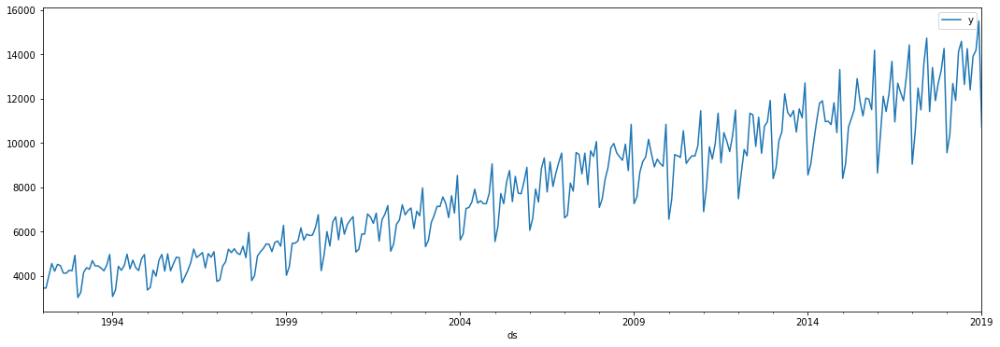

In [12]:
df.plot(x='ds',y='y',figsize=(18,6))

In [13]:
len(df)

325

In [14]:
train = df.iloc[:len(df)-260]
test = df.iloc[len(df)-65:]

In [15]:
m = Prophet()
m.fit(train)
future = m.make_future_dataframe(periods=10220)
forecast = m.predict(future)

14:30:18 - cmdstanpy - INFO - Chain [1] start processing
14:30:19 - cmdstanpy - INFO - Chain [1] done processing


In [16]:
forecast.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
10280,2025-04-20,9202.186963,11279.225016,13201.725686,8298.453586,10176.419463,3026.924426,3026.924426,3026.924426,3026.924426,3026.924426,3026.924426,0.0,0.0,0.0,12229.111388
10281,2025-04-21,9202.616497,10911.104193,12802.807399,8298.845895,10177.080075,2626.783543,2626.783543,2626.783543,2626.783543,2626.783543,2626.783543,0.0,0.0,0.0,11829.400040
10282,2025-04-22,9203.046031,10511.924956,12423.534751,8299.238203,10177.740687,2226.949780,2226.949780,2226.949780,2226.949780,2226.949780,2226.949780,0.0,0.0,0.0,11429.995811
10283,2025-04-23,9203.475565,10082.093580,12046.011624,8299.628909,10178.401299,1838.695856,1838.695856,1838.695856,1838.695856,1838.695856,1838.695856,0.0,0.0,0.0,11042.171421
10284,2025-04-24,9203.905100,9779.175515,11680.277436,8300.018013,10179.061911,1472.703688,1472.703688,1472.703688,1472.703688,1472.703688,1472.703688,0.0,0.0,0.0,10676.608787


In [17]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
10280,2025-04-20,12229.111388,11279.225016,13201.725686
10281,2025-04-21,11829.400040,10911.104193,12802.807399
10282,2025-04-22,11429.995811,10511.924956,12423.534751
10283,2025-04-23,11042.171421,10082.093580,12046.011624
10284,2025-04-24,10676.608787,9779.175515,11680.277436


In [18]:
test.tail()

,ds,y
320,2018-09-01,12396
321,2018-10-01,13914
322,2018-11-01,14174
323,2018-12-01,15504
324,2019-01-01,10718


In [19]:
plot_plotly(m ,forecast)

In [20]:
plot_components_plotly(m, forecast)